# Homework 1: Curse of Dimensionality

## Problem 1: Linear Regression Simulations

We consider $\beta\in\mathbb{R}^{2^{10}}$ (i.e. $p=1024$) such that $\beta_{128}=4$, $\beta_{256}=16$, and $\beta_{512}=64$. We will call this $\beta$ **ground truth** for our simulations. Suppose we only have $n=2^7=128$ samples, and (for now) let us assume we have noiseless samples. To simulate this, we construct a **random** design matrix $X$ and then form $y= X\beta$.

In [17]:
import numpy as np
import numpy.random as rd

def random_design(n, p):
    # Simple function for producing a random design matrix
    # The matrix is n by p and has iid entries Gaussian entries
    # Each Gaussian has mean 0 and variance 1/p. 
    # The variance is chosen so that the squared 2-norm of each
    # row is 1.
    return rd.normal(scale=1/np.sqrt(n), size=(n,p))

# Set the random seed so that results do not change from run to run
rd.seed(37)

# Construct beta
p = 2**10
beta = np.repeat(1,p)
#beta = np.zeros(p)
#beta[int(p/8)] = 4
#beta[int(p/4)] = 16
#beta[int(p/2)] = 64

# Construct a random design matrix for simulation
n = 2**7
X = random_design(n, p)

# Form the product
y = X @ beta

Now, we know that Least Squares regression does not have a unique solution when $n<p$. But, what happens when we try to naively call Linear Regression for $X$ and $y$ using *sklearn*?

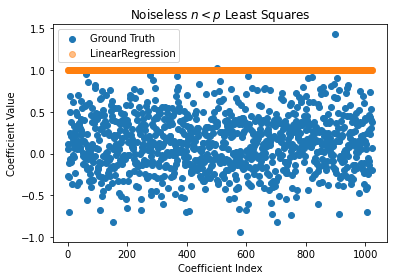

The relative error between GT and LR: 0.9342710772397353


In [18]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import numpy.linalg as la
# fit_intercept = True is the same as appending a column of all 1's to X
reg = LinearRegression(fit_intercept=False).fit(X, y) 

plt.scatter(range(len(reg.coef_)), reg.coef_, alpha=1, label='Ground Truth')
plt.scatter(range(len(beta)), beta, alpha=0.5, label='LinearRegression')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('Noiseless $n<p$ Least Squares')
plt.legend()
plt.show()

print('The relative error between GT and LR: ' + str(la.norm(reg.coef_ - beta)/la.norm(beta)))


Here are some takeaways from this code:

1. LinearRegression does not throw any warnings or errors when $n<p$.
2. If $\beta_i=0$ for the ground truth, then it appears that $|\hat\beta_i|<4$ for the output of LinearRegression.
3. The output of LinearRegression can be used to identify the coefficient index $512$
4. While the relative error between the ground truth $\beta$ and the output of LinearRegression is large (nearly 1), points 2 and 3 indicate that LinearRegression may be used to identify indices $i$ where the ground truth values $\beta_i$ are large. 

This is promising, but first -- what is LinearRegression doing when $n<p$?

If we naively assumed that LinearRegression simply solves the normal equations, we should have received some sort of error when calling LinearRegression. Therefore, LinearRegression is not doing what we expected. To figure things out, we have to go read the API docs for LinearRegression. Here is what we find:

When $n<p$, LinearRegression (which is a wrapper for scipy.linalg.lstsq) finds the solution to the minimization program

$$
\min_{\beta} \Vert \beta\Vert_2^2 \text{ subject to } X\beta=y.
$$

Using Lagrange multipliers, it is not too difficult to show that this solution is

$$
\beta_{ls}=X^T(X X^T)^{-1}y.
$$

The following code shows us that this formula produces a solution that numerically coincides with the solution given by LinearRegression from sklearn.

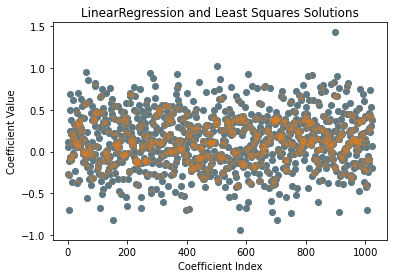

The norm difference is small: 3.129473138346077e-14


In [19]:


beta_lstsq = X.T @ la.solve((X@X.T), y)

plt.scatter(range(len(reg.coef_)), reg.coef_, alpha=1, label='LinearRegression')
plt.scatter(range(len(beta_lstsq)), beta_lstsq, alpha=0.25, label='Least Squares')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('LinearRegression and Least Squares Solutions')
plt.show()

print('The norm difference is small: ' + str(la.norm(reg.coef_ - beta_lstsq)))

Now, what happens if we add some noise and then perform least squares?

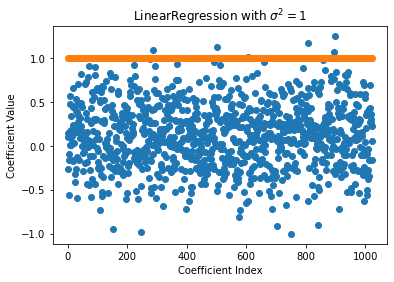

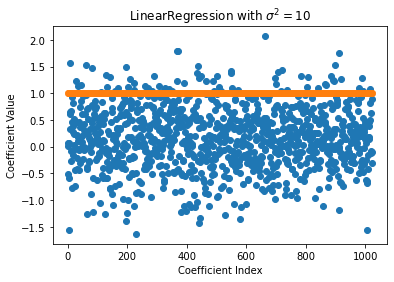

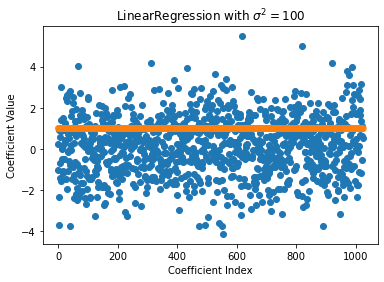

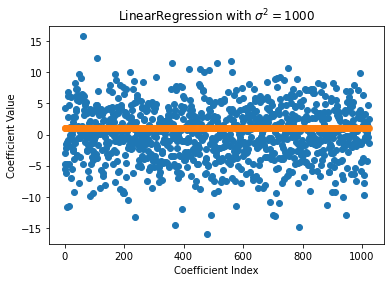

In [20]:
sigma2 = 1 # Noise variance
y_noisy = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))

reg_noisy = LinearRegression(fit_intercept=False).fit(X, y_noisy) 

plt.scatter(range(len(reg_noisy.coef_)), reg_noisy.coef_, alpha=1, label='Ground Truth')
plt.scatter(range(len(beta)), beta, alpha=0.5, label='LinearRegression')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('LinearRegression with $\sigma^2=1$')
plt.show()

sigma2 = 10 # Noise variance
y_noisy = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))

reg_noisy = LinearRegression(fit_intercept=False).fit(X, y_noisy) 

plt.scatter(range(len(reg_noisy.coef_)), reg_noisy.coef_, alpha=1, label='Ground Truth')
plt.scatter(range(len(beta)), beta, alpha=0.5, label='LinearRegression')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('LinearRegression with $\sigma^2=10$')
plt.show()

sigma2 = 100 # Noise variance
y_noisy = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))

reg_noisy = LinearRegression(fit_intercept=False).fit(X, y_noisy) 

plt.scatter(range(len(reg_noisy.coef_)), reg_noisy.coef_, alpha=1, label='Ground Truth')
plt.scatter(range(len(beta)), beta, alpha=0.5, label='LinearRegression')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('LinearRegression with $\sigma^2=100$')
plt.show()

sigma2 = 1000 # Noise variance
y_noisy = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))

reg_noisy = LinearRegression(fit_intercept=False).fit(X, y_noisy) 

plt.scatter(range(len(reg_noisy.coef_)), reg_noisy.coef_, alpha=1, label='Ground Truth')
plt.scatter(range(len(beta)), beta, alpha=0.5, label='LinearRegression')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('LinearRegression with $\sigma^2=1000$')
plt.show()


We see that, for moderate noise variances, the points 2 and 3 described above still hold. But, when $\sigma^2=10^3$ (in the last plot), we can no longer identify the index $512$.

There is one subtle issue that you also might notice. The least squares problem with $n<p$ finds a $\hat\beta$ such that $X\hat\beta=y$. But now that our $y$ is noisy, we are perfectly fitting noise. Thus, it may be possible that we are **over fitting** (i.e. learning the noise instead of the ground truth). The actual problem with over fitting is that our **generalization error** might actually be large. However, when $n$ is small relative to $p$, we are over fitting, but only on a small number of examples, so ultimately this type of over fitting does not substantially impact the generalization error.  

#### Part A: Explain each of the 7 plots produced by the following code. These explanations should include definitions of the following terms: MSE, Predictive MSE, log plot, log-log plot, and false positive.

In [21]:
import plotly.graph_objects as go

rho = [1/4, 1, 1.5, 16]

# Initialize bookkeeping variables
num_samples = np.zeros(len(rho))
mse = np.zeros(len(rho))
predictive_mse = np.zeros(len(rho))
false_positives = np.zeros(len(rho))

sigma2 = 1 # Noise variance

idx = list(range(p))

for i in range(len(rho)):
    n = int(p*rho[i])
    X = random_design(n, p)
    y = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))
    reg = LinearRegression(fit_intercept=False).fit(X, y) 
    
    fig = go.Figure(data=go.Scatter(x=idx, 
                                    y=reg.coef_,
                                    mode='markers',
                                    name='LinearRegression' ))
    fig.add_trace(go.Scatter(x=idx, 
                            y=beta,
                            mode='markers',
                            marker=dict(color='orange', opacity=0.5),
                            name='Ground Truth'
                           ))
    
    fig.update_layout(
        title=r'$\rho={rh:.2f}$'.format(rh = rho[i]),
        xaxis_title="Coefficient Index",
        yaxis_title="Coefficient Value",
        font=dict(family="Computer Modern",
                  size=18,
                  color="Black")
    )

    
    fig.show()
    
    num_samples[i] = n
    mse[i] = la.norm(reg.coef_-beta)**2/p
    predictive_mse[i] = la.norm(y - X@beta)**2/n
    false_positives[i] = np.sum(np.abs(reg.coef_[512])<=np.abs(reg.coef_))-1

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=mse,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus MSE",
    xaxis_title="Samples",
    yaxis_title="MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=predictive_mse,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus Predictive MSE",
    xaxis_title="Samples",
    yaxis_title="Predictive MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=false_positives,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log plot of Samples versus False Positives",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.show()


#### Part B: These plots depict seemingly paradoxical behavior. The MSE, Predictive MSE, and false positives for detecting the largest coefficient seem to increase from $\rho=1/4$ to $\rho=1$. In order to determine if these trends are not just statistical noise, modify the code to record the MSE, Predictive MSE, and false positives for 16 runs given each value of $\rho$ (so you will do 64 different runs). Use this data to make three graphs (one for MSE, Predictive MSE, and false positives) of 4 simultaneous boxplots (via go.Box). Each graph will have four boxplots (one for each value of $\rho$) organized along the horizontal axis, where each individual boxplot uses the 16 values produced by the runs for that $\rho$. 

#### Part C: Based on these simultaneous boxplots from Part B, do these paradoxical behaviors disappear when we consider an "average" run instead of just an "empirical" run? That is, are the relative positions of the simultaneous boxplots consistent with the paradoxical trend we observed in the original plots?

#### Part D: Modify this code to also count false positives for detecting $\beta_{128}$ and $\beta_{256}$. Display and discuss your results.


### Part A
The first four pictures describes $\beta$ from Linear Regression and Ground Truth with different $\rho$s, which represent the ratio of $n$ and $p$.  

When $n<p$, the algorithm select the $\beta$ with the smallest 2-norm. Only one point shows different to the others.  

<font color = 'red'>Cholian: smallest 2-norm? 不是应该是512 的那个beta是显著的，为什么在n<p 的情况下还能把512 显著出来的原因是因为一定程度上的overfiting了吧</font>

When $n=p$, all the coefficients seems messy. In this case, the algorithm tries to solve the linear equations. But the results are largely impacted by the noises. To prove this, we can use smaller noise and can finally find that the smaller the noise is, the closer the results are to the ground truth. With sigma2 = 0.001, we can see they are almost overlapped.  

<font color = 'red'>Cholian: what is the smaller noise? 我的理解是这时候所有的beta 都不是显著的了，受到noises的影响，无法正确的估计beta真实值是多少</font>

When $n>p$, the algorithm tries to solve a least-square problem. We can see the computed coefficients are very close to the true ones. The impact of noises are almost removed.  

<font color = 'red'>Cholian: 随着n的增加，当大于某一个阈值的时候，（图中是4）,对于beta的显著性估计已经达到了稳定，无法通过增加数据量来进一步增加预测精度</font>

MSE is mean squared error. In this situation MSE represents the error between computed coefficients and the true ones.  

Predicted MSE represents the error between the response calculated by the computed design matrix and the true response.  

Log-plot is a plot with the variable in y-axis applied to by the log function. It's used when the range of y is large.  
<font color = 'red'>Cholian: 这里是x的sample比较大，这里说y有点不合适？</font>
Log-log plot is a plot with x and y all applied to by the log function. It's used when the ranges of x and y are both large.  

False positive are the observations that are detected to be positive but negative in fact. In this situation we compute the number of coefficients that are not less than the 512th one other than itself.  

<font color = 'red'>Cholian: 我认为这里的FP表面是说， p(we reject the H0: beta_i = 0 wrongly). 实际上是用来测量该model未能识别出beta 512 的概率</font>

From the MSE plot, we can see when $n=p$ the coefficient error is the biggest, which is caused by the noise. When $n<p$ the strategy of finding the coefficient vector with the smallest norm makes most of the entries close to zero. When $n>p$ the impact of noise are largely reduced.  

<font color = 'red'>Cholian: makes most of the entries close to zero？ 是啥意思</font>

From the Predictive MSE plot, we can see it reaches its min point when $n=p$.  

<font color = 'red'>Cholian: 啥叫min point? 我的理解是在n < p 的时候，是对noise overfitting了，当n=p的时候，开始预测了，但是n=p的时候，受到noise的影响最大，随着n也就是observations的增加，noises的影响逐渐缩小，当到达某一个阈值的时候，reducible error reached the minimal while remaining the irreducible error </font>

From the False Positive plot, we can see that when $n=p$ the entries that are not less than the 512th are the most.

<font color = 'red'>Cholian: 错误的识别beta的概率越来越小，也就是模型的预测能力逐渐增加</font>

### Part B

<font color = 'red'>Cholian: 他让用go.box,并且应该是通过run16 次避免统计错误，不是下面的代码逻辑</font>



In [6]:
num_samples = np.zeros(len(rho))
mse = np.zeros((len(rho),16))
predictive_mse = np.zeros((len(rho),16))
false_positives = np.zeros((len(rho),16))

sigma2 = 1 # Noise variance

idx = list(range(p))

for i in range(len(rho)):
    n = int(p*rho[i])
    num_samples[i] = n
    for j in  range(16):
        X = random_design(n, p)
        y = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))
        reg = LinearRegression(fit_intercept=False).fit(X, y) 
        
        mse[i][j] = la.norm(reg.coef_-beta)**2/p
        predictive_mse[i][j] = la.norm(y - X@beta)**2/n
        false_positives[i][j] = np.sum(np.abs(reg.coef_[512])<=np.abs(reg.coef_))-1

In [7]:
import seaborn as sns
import pandas as pd
df=pd.DataFrame({
    'rho': np.concatenate([[0.25]*16,[1]*16,[4]*16,[16]*16],axis=0),
    'mse': np.reshape(mse,(64,)),
    'predictive_mse': np.reshape(predictive_mse,(64,)),
    'false_positives': np.reshape(false_positives,(64,))
})

Text(0.5, 1.0, 'MSE')

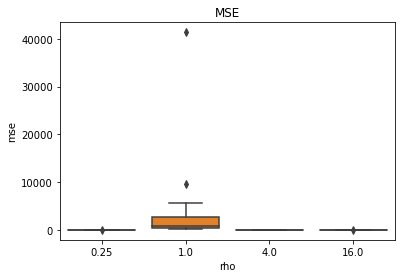

In [8]:
sns.boxplot(x='rho',y='mse',data=df).set_title('MSE')

Text(0.5, 1.0, 'Predictive MSE')

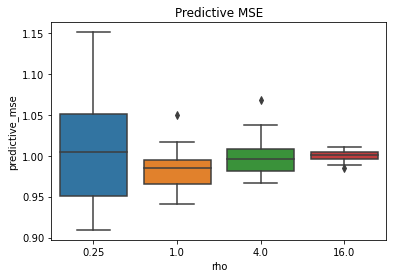

In [9]:
sns.boxplot(x='rho',y='predictive_mse',data=df).set_title('Predictive MSE')

Text(0.5, 1.0, 'False Positives')

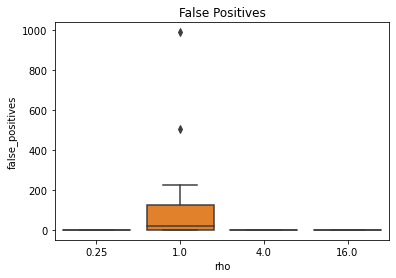

In [10]:
sns.boxplot(x='rho',y='false_positives',data=df).set_title('False Positives')

### Part C

In [11]:
df_ave=df.groupby(['rho']).mean()
df_ave

,mse,predictive_mse,false_positives
rho,,,
0.25,3.321891,1.008409,0.00
1.00,4374.424477,0.983858,136.75
4.00,1.312751,1.001139,0.00
16.00,1.068750,0.999740,0.00


In [1]:
fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['mse'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus MSE",
    xaxis_title="Samples",
    yaxis_title="MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['predictive_mse'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus Predictive MSE",
    xaxis_title="Samples",
    yaxis_title="Predictive MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['false_positives'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log plot of Samples versus False Positives",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.show()

NameError: name 'go' is not defined

Actually the paradoxical behaviors are reduced when statistical factors are taken into account.

<font color = 'red'>为什么会减少。。。。</font>

### Part D

In [80]:
beta128 = np.zeros((len(rho),16))
beta256 = np.zeros((len(rho),16))

for i in range(len(rho)):
    n = int(p*rho[i])
    num_samples[i] = n
    for j in  range(16):
        X = random_design(n, p)
        y = X @ beta + rd.normal(scale=np.sqrt(sigma2), size=(n,))
        reg = LinearRegression(fit_intercept=False).fit(X, y) 
        
        beta128[i][j] = np.sum(np.abs(reg.coef_[128])<=np.abs(reg.coef_))-1
        beta256[i][j] = np.sum(np.abs(reg.coef_[256])<=np.abs(reg.coef_))-1


In [81]:
df1=pd.DataFrame({
    'rho': np.concatenate([[0.25]*16,[1]*16,[4]*16,[16]*16],axis=0),
    'beta128': np.reshape(beta128,(64,)),
    'beta256': np.reshape(beta256,(64,)),
})
df1_ave=df1.groupby(['rho']).mean()
df1_ave

,beta128,beta256
rho,,
0.25,378.125,1.1250
1.00,523.750,465.4375
4.00,9.375,1.0000
16.00,6.000,1.0000


In [84]:
fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df1_ave['beta128'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus False Positives beta128",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df1_ave['beta256'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus False Positives beta256",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

## Problem 2: Classification Simulations

#### Repeat the analysis of Problem 1, but do it for *sklearn.linear_model.LogisticRegression*. That is, explain what *LogisiticRegression* is doing when $n<p$, and then carry out Part A, Part B, Part C, and Part D from Problem 1 for the logistic regression example below. How are these results different from the linear regression case?

In [104]:
from sklearn.linear_model import LogisticRegression

def logit(x):
    return 1/(1+np.exp(-x))

num_samples = np.zeros(len(rho))
mse = np.zeros(len(rho))
predictive_mse = np.zeros(len(rho))
false_positives = np.zeros(len(rho))

for i in range(len(rho)):
    n = int(p*rho[i])
    X = random_design(n, p)
    y = (rd.random(n) < logit(X @ beta))
    
    logreg = LogisticRegression(fit_intercept=False).fit(X, y)
    
    fig = go.Figure(data=go.Scatter(x=idx, 
                                    y=np.reshape(logreg.coef_,(1024,)),
                                    mode='markers',
                                    name='LogisticRegression' ))
    fig.add_trace(go.Scatter(x=idx, 
                           y=beta,
                            mode='markers',
                            marker=dict(color='orange', opacity=0.5),
                            name='Ground Truth'
                           ))
    
    fig.update_layout(
        title=r'$\rho={rh:.2f}$'.format(rh = rho[i]),
        xaxis_title="Coefficient Index",
        yaxis_title="Coefficient Value",
        font=dict(family="Computer Modern",
                  size=18,
                  color="Black")
    )

    
    fig.show()
    
    print(np.sum((np.ravel(logreg.coef_)-np.ravel(beta))**2)/p)
    
    coef=np.reshape(logreg.coef_,(1024,))
    num_samples[i] = n
    mse[i] = la.norm(coef-beta)**2/p
    predictive_mse[i] = la.norm(y - logit(X @ beta))**2/n
    false_positives[i] = np.sum(np.abs(coef[512])<=np.abs(coef))-1
    
fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=mse,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus MSE",
    xaxis_title="Samples",
    yaxis_title="MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=predictive_mse,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus Predictive MSE",
    xaxis_title="Samples",
    yaxis_title="Predictive MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=false_positives,
                                mode='lines'
                               ))
fig.update_layout(
    title="Log plot of Samples versus False Positives",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.show()


3.9241071359437103


3.6153506907693123


3.196120798523165


3.0295662891642037


According to sklearn API reference documentation, LogiticRegression tries to solve one of the optimization problems:
$$\min_{w,c}\frac{1}{2}w^Tw+C\Sigma_{i=1}^nlog(exp(-y_i(X_i^Tw+c))+1)$$
$$\min_{w,c}\Vert w\Vert_1+C\Sigma_{i=1}^nlog(exp(-y_i(X_i^Tw+c))+1)$$
$$\min_{w,c}\frac{1-\rho}{2}w^Tw+\rho\Vert w\Vert_1+C\Sigma_{i=1}^nlog(exp(-y_i(X_i^Tw+c))+1)$$

### Part A
## Comment A

We can see that the curves in the MSE plot, predictive MSE plot and False Positives plot are smoother than that in LinearRegression.

<font color = 'red'>logistic regression 受sample size的影响较小，而且，不存在当n <p 的时候overfitting的问题</font>

### Part B

In [127]:
num_samples = np.zeros(len(rho))
mse = np.zeros((len(rho),16))
predictive_mse = np.zeros((len(rho),16))
false_positives = np.zeros((len(rho),16))

sigma2 = 1 # Noise variance

idx = list(range(p))

for i in range(len(rho)):
    n = int(p*rho[i])
    num_samples[i] = n
    for j in  range(16):
        X = random_design(n, p)
        y = (rd.random(n) < logit(X @ beta))
        logreg = LogisticRegression(fit_intercept=False).fit(X, y)
        
        coef=np.reshape(logreg.coef_,(1024,))
        num_samples[i] = n
        mse[i][j] = la.norm(coef-beta)**2/p
        predictive_mse[i][j] = la.norm(y - logit(X @ beta))**2/n
        false_positives[i][j] = np.sum(np.abs(coef[512])<=np.abs(coef))-1

In [128]:
import seaborn as sns
import pandas as pd
df=pd.DataFrame({
    'rho': np.concatenate([[0.25]*16,[1]*16,[4]*16,[16]*16],axis=0),
    'mse': np.reshape(mse,(64,)),
    'predictive_mse': np.reshape(predictive_mse,(64,)),
    'false_positives': np.reshape(false_positives,(64,))
})

Text(0.5, 1.0, 'MSE')

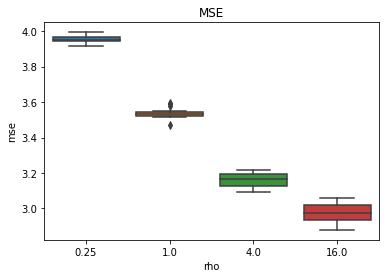

In [130]:
sns.boxplot(x='rho',y='mse',data=df).set_title('MSE')

Text(0.5, 1.0, 'Predictive MSE')

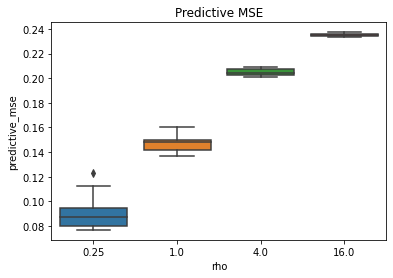

In [131]:
sns.boxplot(x='rho',y='predictive_mse',data=df).set_title('Predictive MSE')

Text(0.5, 1.0, 'False Positives')

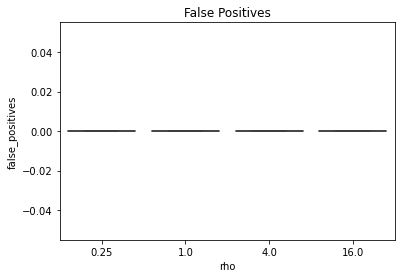

In [132]:
sns.boxplot(x='rho',y='false_positives',data=df).set_title('False Positives')

## Comment B

LogisticRegression is more stable. And in this situation it's less impacted by statistical factors than LinearRegression.

### Part C

In [133]:
df_ave=df.groupby(['rho']).mean()
df_ave

,mse,predictive_mse,false_positives
rho,,,
0.25,3.955741,0.090135,0.0
1.00,3.536396,0.147393,0.0
4.00,3.161466,0.204754,0.0
16.00,2.974687,0.235190,0.0


In [134]:
fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['mse'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus MSE",
    xaxis_title="Samples",
    yaxis_title="MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['predictive_mse'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus Predictive MSE",
    xaxis_title="Samples",
    yaxis_title="Predictive MSE",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df_ave['false_positives'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log plot of Samples versus False Positives",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.show()

## Comment C

We can see Logistic Regression is more stable. (As for the second picture, considering the unit the change is not so significant.)

### Part D

In [128]:
beta128 = np.zeros((len(rho),16))
beta256 = np.zeros((len(rho),16))

for i in range(len(rho)):
    n = int(p*rho[i])
    num_samples[i] = n
    for j in  range(16):
        X = random_design(n, p)
        y = (rd.random(n) < logit(X @ beta))
        logreg = LogisticRegression(fit_intercept=False).fit(X, y)
        
        coef=np.reshape(logreg.coef_,(1024,))
        
        beta128[i][j] = np.sum(np.abs(coef[128])<=np.abs(coef))-1
        beta256[i][j] = np.sum(np.abs(coef[256])<=np.abs(coef))-1

NameError: name 'rho' is not defined

In [136]:
df1=pd.DataFrame({
    'rho': np.concatenate([[0.25]*16,[1]*16,[4]*16,[16]*16],axis=0),
    'beta128': np.reshape(beta128,(64,)),
    'beta256': np.reshape(beta256,(64,)),
})
df1_ave=df1.groupby(['rho']).mean()
df1_ave

,beta128,beta256
rho,,
0.25,573.1250,12.3750
1.00,308.4375,1.4375
4.00,132.3750,1.0000
16.00,149.3125,1.0000


In [137]:
fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df1_ave['beta128'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus False Positives beta128",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

fig = go.Figure(data=go.Scatter(x=num_samples, 
                                y=df1_ave['beta256'],
                                mode='lines'
                               ))
fig.update_layout(
    title="Log-Log plot of Samples versus False Positives beta256",
    xaxis_title="Samples",
    yaxis_title="False Positives",
    font=dict(
        family="Computer Modern",
        size=14,
        color="Black"
    )
)
                
fig.update_xaxes(type="log")
fig.update_yaxes(type='log')
fig.show()

## Comment D
In this situation, logistic regression can somehow detect the 128th entry and 256th entry of $\beta$ with appropriate $\rho$. The curve is smoother than the curve in linear regression.

## Problem 3: Log-Returns of S&P 500 data

The code below extracts one year of daily stock market indicators for 433 symbols from the S&P 500 index. This code extracts the data, and then produces the daily log-return for each symbol:

$$
\log \frac{\text{Closing Price}}{\text{Opening Price}}
$$

where the opening price is the price of the stock at the opening of the market and closing price is the price of the stock at the closing of the market. The log-returns are conveniently scale-free and allow us to compare market data across long time frames where indices may exhibit dramatically different scales. Log-returns also allow us to compare price growths across groups of stocks whose individual prices may be very different.

#### Part A: The first graph produced by the code below compares log tail probabilities, $\log p(\vert X\vert >x)$, for the log-returns from this dataset, a Gaussian with the same mean and variance as the log-returns, and a Laplacian with the same mean and variance as the log-returns. It also illustrates how estimated log tail probabilities may differ from theoretical tail probabilities. From this graph, what do you observe about the tail probabilities for the log-returns? Does the empirical versus theoretical illustration for the Gaussian and Laplacian tail probabilities give you more or less confidence in your observation?

#### Part B: The second graph considers log tail probabilities for the means of the log-returns across the 433 observed symbols, and also considers the Gaussian and Laplacian with the same mean and variance. Answer the questions from Part A for this data as well.

#### Part C: In Lecture 02, we learned that it is difficult to detect small values of $\mu_i$ in the Normal Means problem while suppressing false positives. Given the nature of the log tail probabilities for means of log-returns data, should it be easier, equally difficult, or harder to detect small values of $\mu_i$ for log-returns data while suppressing false positives? Why?

In [7]:
import pandas as pd
import numpy as np
import numpy.random as rd
import plotly.graph_objects as go

def erf(x):
    # Simple error function approximation
    sign = np.sign(x)
    x = abs(x)

    # constants
    a1 =  0.254829592
    a2 = -0.284496736
    a3 =  1.421413741
    a4 = -1.453152027
    a5 =  1.061405429
    p  =  0.3275911

    # A&S formula 7.1.26
    t = 1.0/(1.0 + p*x)
    y = 1.0 - (((((a5*t + a4)*t) + a3)*t + a2)*t + a1)*t*np.exp(-x*x)
    return sign*y # erf(-x) = -erf(x)

def lap_cdf(x):
    # Implementation of the standard Laplacian cdf
    sign = np.sign(x)
    pos = x>0
    return pos - sign*np.exp(-sign*x)/2

df = pd.read_csv("./finance/data.csv")

all = np.array([])
lrmeans = np.zeros(433)

for i in range(433):
    x=np.diff(np.log(np.array(df['Open.' + str(i+1)][2:].astype(float))))
    lrmeans[i] = np.nanmean(x)
    all = np.concatenate((all, x))

mu = np.nanmean(all)
sig = np.nanvar(all)
b = np.sqrt(sig / 2) # For Laplacian scale parameter

all_real = np.abs(all[np.logical_not(np.isnan(all))])
N = all_real.shape[0] # Number of log return samples
gauss_samples = np.abs(np.sqrt(sig)*rd.randn(N)+mu)
lap_samples = np.abs(rd.laplace(loc=mu, scale=b, size=N))
t = np.linspace(-0.4, 0.4, 100)
x = np.linspace(0,0.25,100)
tail_log_probs = np.zeros(100)
emp_gauss_tail_log_probs = np.zeros(100)
emp_lap_tail_log_probs = np.zeros(100)

for i in range(100):
    tail_log_probs[i] = np.log(np.sum(all_real > x[i])) - np.log(N)
    emp_gauss_tail_log_probs[i] = np.log(np.sum(gauss_samples > x[i])) - np.log(N)
    emp_lap_tail_log_probs[i] = np.log(np.sum(lap_samples > x[i])) - np.log(N)

gauss_tail_log_probs = np.log(2*(1-((1 + erf((x - mu) / np.sqrt(2 * sig))) / 2)))
lap_tail_log_probs = np.log(2*(1-lap_cdf((x - mu) / b)))

# Construct tail log probabilities from gaussian and laplacian cdfs for the same range
fig = go.Figure(data=[go.Scatter(x=x,
                                 y=tail_log_probs,
                                 name='log Return (Empirical)',
                                 line=dict(width=4,)
                                ),
                      go.Scatter(x=x,
                                 y=emp_gauss_tail_log_probs,
                                 name='Gaussian (Empirical)',
                                 line=dict(width=4)
                                ),
                      go.Scatter(x=x,
                                 y=emp_lap_tail_log_probs,
                                 name='Laplacian (Empirical)',
                                 line=dict(width=4)
                                ),
                      go.Scatter(x=x,
                                 y=gauss_tail_log_probs,
                                 name='Gaussian (Theoretical)',
                                 line=dict(width=2, dash='dash')
                                ),
                      go.Scatter(x=x,
                                 y=lap_tail_log_probs,
                                 name='Laplacian (Theoretical)',
                                 line=dict(width=2, dash='dash')
                                )
                     ],
                layout=go.Layout(title=go.layout.Title(text="Log Tail Probabilities"))
               )
fig.show()

print('Mean of all log returns is %f2.1' % mu)

mu_mean = np.nanmean(lrmeans)
sig_mean = np.nanvar(lrmeans)
b_mean = np.sqrt(sig_mean / 2)  # For Laplacian scale parameter

all_means = np.abs(lrmeans[np.logical_not(np.isnan(lrmeans))]-mu_mean)
N_means = len(all_means)
gauss_samples = np.abs(np.sqrt(sig_mean) * rd.randn(N_means))
lap_samples = np.abs(rd.laplace(loc=0, scale=b_mean, size=N_means))
x = np.linspace(0,0.01,100)
tail_log_probs = np.zeros(100)
emp_gauss_tail_log_probs = np.zeros(100)
emp_lap_tail_log_probs = np.zeros(100)

for i in range(100):
    tail_log_probs[i] = np.log(np.sum(all_means > x[i])) - np.log(N_means)
    emp_gauss_tail_log_probs[i] = np.log(np.sum(gauss_samples > x[i])) - np.log(N_means)
    emp_lap_tail_log_probs[i] = np.log(np.sum(lap_samples > x[i])) - np.log(N_means)

gauss_tail_log_probs = np.log(2*(1-((1 + erf((x) / np.sqrt(2 * sig_mean))) / 2)))
lap_tail_log_probs = np.log(2*(1-lap_cdf((x) / b_mean)))

# Construct tail log probabilities from gaussian and laplacian cdfs for the same range
fig = go.Figure(data=[go.Scatter(x=x,
                                 y=tail_log_probs,
                                 name='log Return (Empirical)',
                                 line=dict(width=4, )
                                 ),
                      go.Scatter(x=x,
                                 y=emp_gauss_tail_log_probs,
                                 name='Gaussian (Empirical)',
                                 line=dict(width=4)
                                 ),
                      go.Scatter(x=x,
                                 y=emp_lap_tail_log_probs,
                                 name='Laplacian (Empirical)',
                                 line=dict(width=4)
                                 ),
                      go.Scatter(x=x,
                                 y=gauss_tail_log_probs,
                                 name='Gaussian (Theoretical)',
                                 line=dict(width=2, dash='dash')
                                 ),
                      go.Scatter(x=x,
                                 y=lap_tail_log_probs,
                                 name='Laplacian (Theoretical)',
                                 line=dict(width=2, dash='dash')
                                 )
                      ],
                layout=go.Layout(title=go.layout.Title(text="Log Tail Probabilities for Mean Log Returns"))
                )
fig.show()



norm_cdf = (1 + erf((t-mu)/np.sqrt(2*sig)))/2
exp_cdf = lap_cdf((t-mu)/b)

fig = go.Figure(data=[go.Histogram(x=all, histnorm='probability', name='log Returns')],
                layout=go.Layout(title=go.layout.Title(text="Histogram of Log Returns"))
                )
fig.show()

fig = go.Figure(data=[go.Histogram(x=lrmeans, histnorm='probability', name='Mean log Returns')],
                layout=go.Layout(title=go.layout.Title(text="Histogram of Mean Log Returns"))
                )
fig.show()

fig = go.Figure(data=[go.Histogram(x=all,
                                   xbins=dict(start=-0.4,end=0.4),
                                   histnorm='probability',
                                   cumulative_enabled=True,
                                   name='log Returns'),
                      go.Scatter(x=t, y=norm_cdf, name='Gaussian'),
                      go.Scatter(x=t, y=exp_cdf, name='Laplace')
                      ],
                layout=go.Layout(title=go.layout.Title(text="Comparison of CDFs")))
fig.show()

D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning: Mean of empty slice
D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in log
D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: divide by zero encountered in log
D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:59: RuntimeWarning: divide by zero encountered in log


Mean of all log returns is 0.0006832.1


D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning:

divide by zero encountered in log

D:\Anaconda\envs\learn\lib\site-packages\ipykernel_launcher.py:111: RuntimeWarning:

divide by zero encountered in log



### Part A
The distribution seems to have a larger tail than Gaussian distribution and laplacian distribution.  
The empirical plots are rather close to the theoretical ones in the range, which gives us more confidence about the sample number, about the accuracy of the log return.

### Part B
The log return curve has a rather stable part in the beginning with an unstable part in the tail.  
In this case the empirical plots are away from the theoretical ones in the tail of the given range, which may be caused by the lack of samples. They illustrates that our log-return curve has a convincing head and a unconvincing tail.

### Part C
Easier. With a larger tail, we need a smaller value on x-axis to find false positives. With a smaller value, the small $\mu_i$s are easier to be detected.

## Problem 4: Riboflavin Production

The data provided in the **riboflavin** directory contains **riboflavinx.csv** and **riboflaviny.csv** which contain a $71$ by $4088$ design matrix and $71$ responses. See the following paper for more details:

#### Bühlmann, P., Kalisch, M., & Meier, L. (2014). High-dimensional statistics with a view toward applications in biology.

#### Part A: Write code that loads this data and performs regression (use the sklearn regression fitting specified in the code for Problem 1), and display predicted beta values like in the output from Problem 1. 

#### Part C: It is difficult to assess the validity of beta values from Part A, but we can assess the predictive error that these beta values provide. Perform a leave-one-out cross-validation procedure to assess the predictive error. That is, for each of the 71 data points $(x_i, y_i)$, train LogisticRegression on the other 70 data points and evaluate the predictive error for the single data point $(x_i, y_i)$. Report the resulting leave-one-out mse (the average of the squared predictive errors). Does this value lead you to believe that LogisiticRegression is good model for the Riboflavin dataset?

#### Part B: While it is easy to run linear regression and assess the resulting predictive error, for real data we do not have the ground truth, so we do not know if large beta values correspond to some true dependence relationship between the explanatory variable and the response variable. Therefore, it is useful to consider tests for statistical dependendence beteween the explanatory variables and response variables.

#### For this problem, code up the statistic $\xi_n(X,Y)$ indicated in Equation (1.1) on Page 2 of the following paper:

#### Chatterjee, S. (2019). A new coefficient of correlation. arXiv e-prints, page. arXiv preprint arXiv:1909.10140, 711.

#### Use this statistic to test dependence between the 4088 explanatory variables and the response variable from the Riboflavin dataset. What can you say about the relationship between the values of the beta's from LinearRegression and the values of Chatterjee's rank correlation statistic?

### Part A

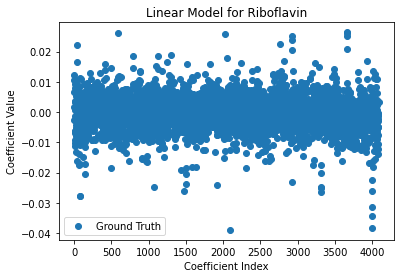

In [2]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import numpy.linalg as la
import matplotlib.pyplot as plt

ribo_x=pd.read_csv('riboflavin/riboflavinx.csv')
ribo_y=pd.read_csv('riboflavin/riboflaviny.csv')
ribo_x=ribo_x.iloc[:,1:4089]
ribo_y=ribo_y.iloc[:,1]
model = LinearRegression(fit_intercept=False).fit(ribo_x, ribo_y) 

plt.scatter(range(len(model.coef_)), model.coef_, alpha=1, label='Ground Truth')
plt.xlabel('Coefficient Index')
plt.ylabel('Coefficient Value')
plt.title('Linear Model for Riboflavin')
plt.legend()
plt.show()

### Part C

In [132]:
average=(min(ribo_y)+max(ribo_y))/2
log_y=(ribo_y>average)

In [154]:
from sklearn.linear_model import LogisticRegression
error=np.zeros(71)
index=np.arange(71)
for i in range(71):
    train_x=ribo_x.iloc[np.delete(index,i),:]
    train_y=log_y.iloc[np.delete(index,i)]
    temp_model = LogisticRegression(fit_intercept=False,solver='liblinear').fit(train_x, train_y) 
    temp_pre=temp_model.predict(ribo_x.iloc[i:(i+1),:])
    error[i]=(temp_pre.astype(int)-log_y[i].astype(int))**2


In [157]:
np.mean(error)

0.29577464788732394

We can think the model has an accuracy of 0.7 approximately. But to fit into the model, we need to categorize the response vector, which means we are losing some information. It's not the perfect model.

### Part B

In [107]:
def chatterjee(x,y):
    n=len(x)
    df=pd.DataFrame({'X':x,'Y':y})
    df['rank_x']=df['X'].rank()
    df['rank_y']=df['Y'].rank()
    df=df.sort_values(by='rank_x')
    sum_term1=df['rank_y'].diff().abs().sum()
    sum_term2=((df['rank_y']-1)*(n+1-df['rank_y'])).sum()
    #return 1-(n*sum_term1)/(2*sum_term2)
    return (1-3*sum_term1/(pow(n,2)-1))

In [114]:
###testing
n=200
x=np.random.uniform(-1,1,n)
y=np.random.uniform(-1,1,n)
chatterjee(x,y)

0.007800195004875166

In [115]:
np.argsort([1,2,3,4])

array([0, 1, 2, 3], dtype=int64)

In [109]:
cor=np.zeros(4088)
for i in range(4088):
    temp_x=ribo_x.iloc[:,i]
    cor[i]=chatterjee(temp_x,ribo_y)


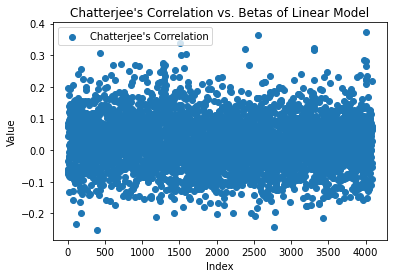

In [110]:
plt.scatter(range(4088), cor, alpha=1, label='Chatterjee\'s Correlation')

plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Chatterjee\'s Correlation vs. Betas of Linear Model')
plt.legend()
plt.show()

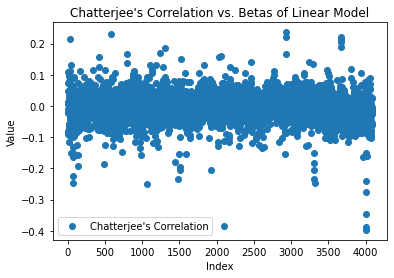

In [111]:
aver=np.zeros(4088)
for i in range(4088):
    aver[i]=np.mean(ribo_x.iloc[:,i])

plt.scatter(range(4088), model.coef_*aver, alpha=1, label='Chatterjee\'s Correlation')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Chatterjee\'s Correlation vs. Betas of Linear Model')
plt.legend()
plt.show()

In [120]:
length=10
rates=(np.arange(length)+1)/20
ratios=np.zeros(length)
n=4088
cor_sort=np.argsort(cor)
coef_sort=np.argsort(np.abs(model.coef_*aver))

for i in range(length):
    temp_df=pd.DataFrame(cor_sort[(n-int(n*rates[i])):n])
    ratios[i]=np.mean(temp_df.isin(coef_sort[(n-int(n*rates[i])):n]))
ratios

array([0.17156863, 0.17156863, 0.21207178, 0.25581395, 0.28767123,
       0.33442088, 0.38671329, 0.43119266, 0.48232735, 0.51272016])

When chatterjee's correlation is high, the corresponding $\beta$ shows important.

## Problem 5: Choose your own adventure

Find a high-dimensional dataset (p>200) that interests you, and which involves a regression or classification task. Perform linear regression or logistic regression classification for your dataset, display and discuss your results, and discuss how the high-dimensionality of your dataset makes the regression or classification task more complex. Be sure to submit your dataset as a CSV file.

Dataset from http://archive.ics.uci.edu/ml/datasets/gene+expression+cancer+RNA-Seq

In [137]:
df1=pd.read_csv('data.csv')
df2=pd.read_csv('labels.csv')
df1=df1.iloc[:,1:20532]
df2=df2.iloc[:,1]

'data.csv' collects the gene expressions. 'labels.csv' represents the kinds of cancer.  
To carry out a logistic regression, we only consider whether the label is 'LUAD' or not, making it a binary-classification problem.

In [146]:
labels=np.zeros(801)
labels[df2=='LUAD']=1

In [147]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df1, labels, test_size=0.2, random_state=42)

In [150]:
from sklearn.linear_model import LogisticRegression
temp_model = LogisticRegression(fit_intercept=False,solver='liblinear').fit(X_train, y_train) 
temp_pre=temp_model.predict(X_test)
np.mean((temp_pre-y_test)**2)

0.0

From the testing error, we can see the problem is perfectly solved.  

High-dimensionality increases the coefficients of regression model, which makes us need to consider more about which factors are making sense.  
Another problem is that there might be much more correlated predictors, which can make the regression model biased.